#  Food-101 Dataset Exploration

Ce notebook explore le dataset Food-101 et analyse sa distribution.

**Objectifs:**
- Charger et visualiser le dataset
- Analyser la distribution des classes
- Visualiser des exemples d'images
- Calculer les statistiques des images

In [1]:
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import torch
from collections import Counter

# Configuration
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)

# Ajouter le path parent
sys.path.append('..')

from src.data.dataset import Food101Dataset
from src.data.transforms import get_transforms

print(" Imports réussis")

 Imports réussis


## 1. Chargement du Dataset

In [2]:
# Charger les datasets
data_dir = '../data/food-101'

# Sans transformations pour l'exploration
train_dataset = Food101Dataset(data_dir, split='train', transform=None)
test_dataset = Food101Dataset(data_dir, split='test', transform=None)

print(f"Train images: {len(train_dataset)}")
print(f"Test images: {len(test_dataset)}")
print(f"Total classes: {len(train_dataset.classes)}")
print(f"\nClasses (premières 10):")
for i, cls in enumerate(train_dataset.classes[:10]):
    print(f"  {i}: {cls}")

 Food101Dataset (train): 75750 images, 101 classes
 Food101Dataset (test): 25250 images, 101 classes
Train images: 75750
Test images: 25250
Total classes: 101

Classes (premières 10):
  0: apple_pie
  1: baby_back_ribs
  2: baklava
  3: beef_carpaccio
  4: beef_tartare
  5: beet_salad
  6: beignets
  7: bibimbap
  8: bread_pudding
  9: breakfast_burrito


## 2. Distribution des Classes

Distribution du dataset:
  Train - Min: 750, Max: 750, Mean: 750.0
  Test - Min: 250, Max: 250, Mean: 250.0


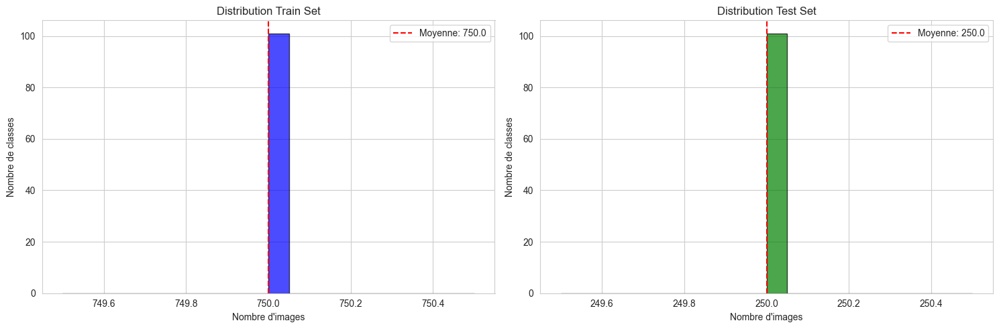

In [3]:
# Distribution train
train_dist = train_dataset.get_class_distribution()
test_dist = test_dataset.get_class_distribution()

# Vérifier l'équilibre
train_counts = list(train_dist.values())
test_counts = list(test_dist.values())

print("Distribution du dataset:")
print(f"  Train - Min: {min(train_counts)}, Max: {max(train_counts)}, Mean: {np.mean(train_counts):.1f}")
print(f"  Test - Min: {min(test_counts)}, Max: {max(test_counts)}, Mean: {np.mean(test_counts):.1f}")

# Visualisation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.hist(train_counts, bins=20, color='blue', alpha=0.7, edgecolor='black')
ax1.set_xlabel('Nombre d\'images')
ax1.set_ylabel('Nombre de classes')
ax1.set_title('Distribution Train Set')
ax1.axvline(np.mean(train_counts), color='red', linestyle='--', label=f'Moyenne: {np.mean(train_counts):.1f}')
ax1.legend()

ax2.hist(test_counts, bins=20, color='green', alpha=0.7, edgecolor='black')
ax2.set_xlabel('Nombre d\'images')
ax2.set_ylabel('Nombre de classes')
ax2.set_title('Distribution Test Set')
ax2.axvline(np.mean(test_counts), color='red', linestyle='--', label=f'Moyenne: {np.mean(test_counts):.1f}')
ax2.legend()

plt.tight_layout()
plt.show()

## 3. Visualisation d'Exemples

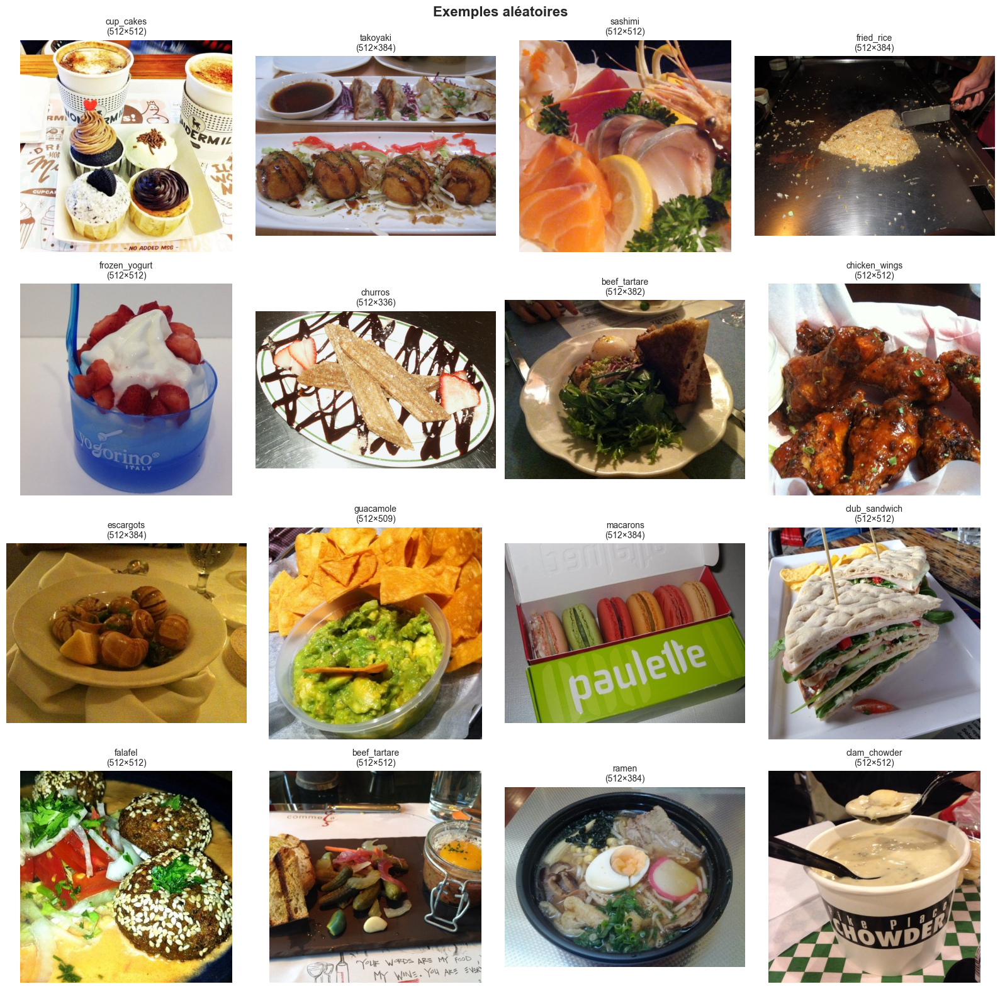

In [4]:
# Afficher des exemples aléatoires
def show_random_samples(dataset, num_samples=16, title="Exemples aléatoires"):
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    
    n_cols = 4
    n_rows = num_samples // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
    axes = axes.flatten()
    
    for i, idx in enumerate(indices):
        img, label = dataset[idx]
        class_name = dataset.get_class_name(label)
        
        axes[i].imshow(img)
        axes[i].set_title(f"{class_name}\n({img.size[0]}×{img.size[1]})", fontsize=10)
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

show_random_samples(train_dataset, num_samples=16)

## 4. Analyse des Tailles d'Images

Statistiques des images (échantillon de 1000):
  Largeur - Min: 287, Max: 512, Mean: 495.8
  Hauteur - Min: 241, Max: 512, Mean: 475.1
  Aspect ratio - Min: 0.56, Max: 2.12, Mean: 1.07


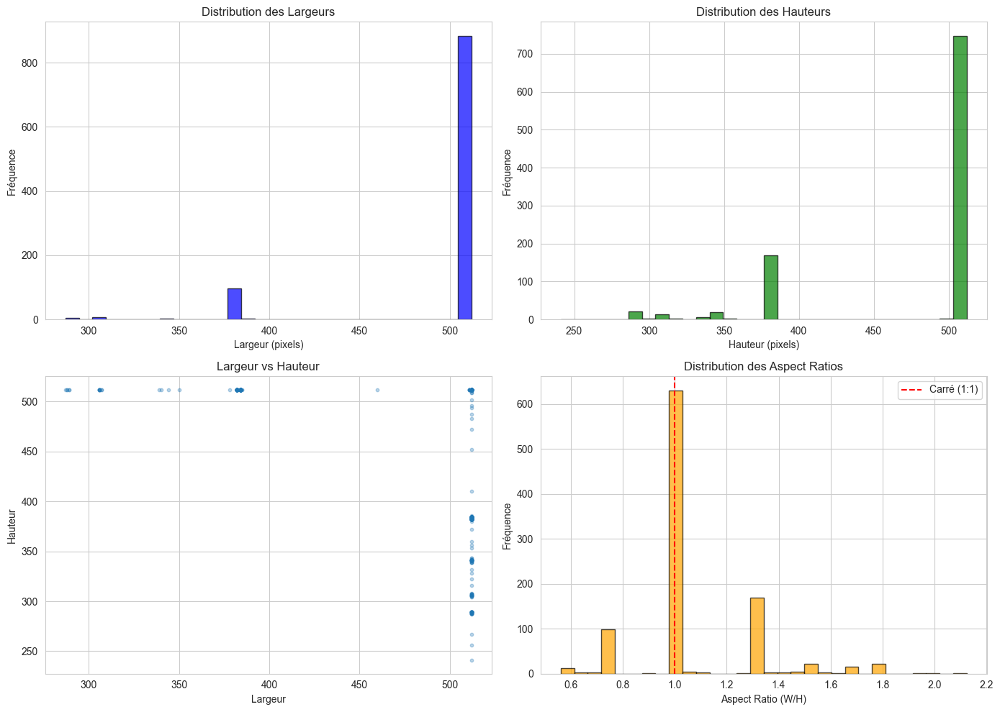

In [5]:
# Échantillonner pour accélérer l'analyse
sample_size = 1000
indices = np.random.choice(len(train_dataset), sample_size, replace=False)

widths = []
heights = []
aspects = []

for idx in indices:
    img, _ = train_dataset[idx]
    w, h = img.size
    widths.append(w)
    heights.append(h)
    aspects.append(w/h)

print("Statistiques des images (échantillon de 1000):")
print(f"  Largeur - Min: {min(widths)}, Max: {max(widths)}, Mean: {np.mean(widths):.1f}")
print(f"  Hauteur - Min: {min(heights)}, Max: {max(heights)}, Mean: {np.mean(heights):.1f}")
print(f"  Aspect ratio - Min: {min(aspects):.2f}, Max: {max(aspects):.2f}, Mean: {np.mean(aspects):.2f}")

# Visualisation
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].hist(widths, bins=30, color='blue', alpha=0.7, edgecolor='black')
axes[0, 0].set_xlabel('Largeur (pixels)')
axes[0, 0].set_ylabel('Fréquence')
axes[0, 0].set_title('Distribution des Largeurs')

axes[0, 1].hist(heights, bins=30, color='green', alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('Hauteur (pixels)')
axes[0, 1].set_ylabel('Fréquence')
axes[0, 1].set_title('Distribution des Hauteurs')

axes[1, 0].scatter(widths, heights, alpha=0.3, s=10)
axes[1, 0].set_xlabel('Largeur')
axes[1, 0].set_ylabel('Hauteur')
axes[1, 0].set_title('Largeur vs Hauteur')

axes[1, 1].hist(aspects, bins=30, color='orange', alpha=0.7, edgecolor='black')
axes[1, 1].set_xlabel('Aspect Ratio (W/H)')
axes[1, 1].set_ylabel('Fréquence')
axes[1, 1].set_title('Distribution des Aspect Ratios')
axes[1, 1].axvline(1.0, color='red', linestyle='--', label='Carré (1:1)')
axes[1, 1].legend()

plt.tight_layout()
plt.show()

## 5. Exemples par Classe

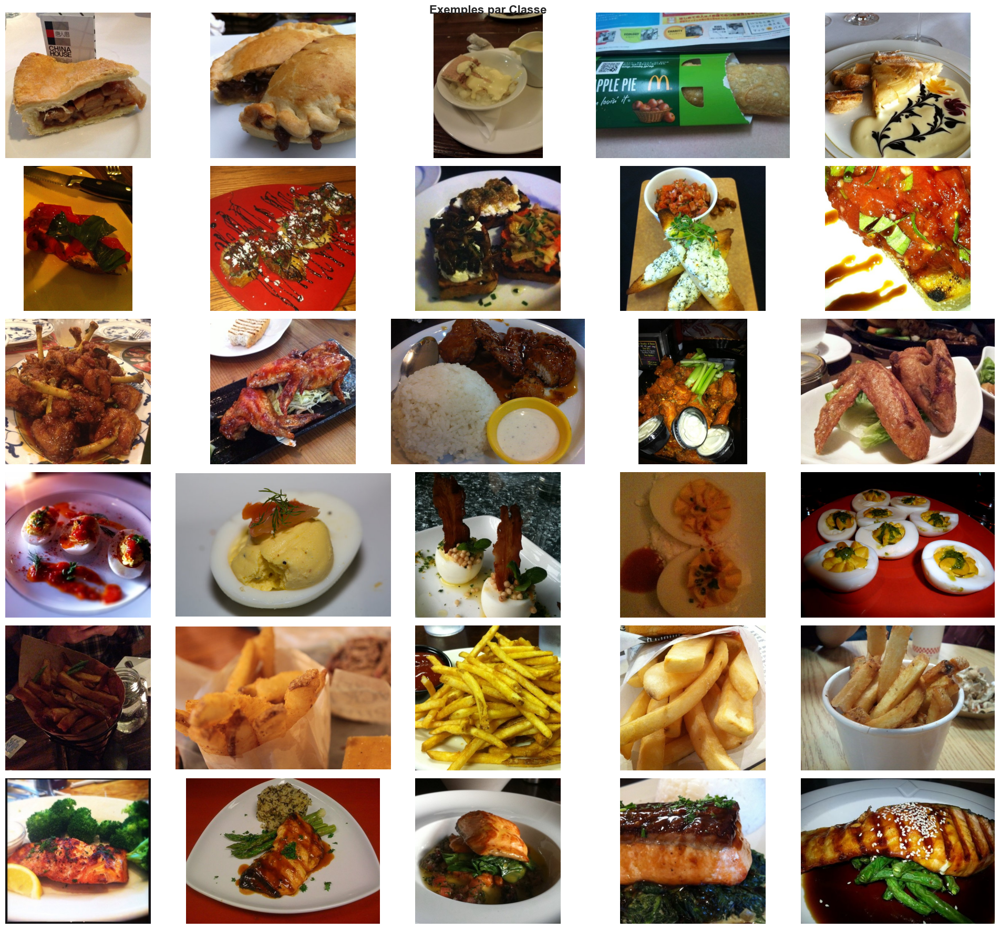

In [6]:
# Afficher des exemples pour quelques classes spécifiques
def show_class_examples(dataset, class_indices, num_per_class=4):
    n_classes = len(class_indices)
    
    fig, axes = plt.subplots(n_classes, num_per_class, figsize=(4*num_per_class, 3*n_classes))
    
    for row, class_idx in enumerate(class_indices):
        class_name = dataset.get_class_name(class_idx)
        
        # Trouver des images de cette classe
        class_images = [i for i, label in enumerate(dataset.labels) if label == class_idx]
        selected = np.random.choice(class_images, num_per_class, replace=False)
        
        for col, idx in enumerate(selected):
            img, _ = dataset[idx]
            axes[row, col].imshow(img)
            if col == 0:
                axes[row, col].set_ylabel(class_name, fontsize=12, fontweight='bold')
            axes[row, col].axis('off')
    
    plt.suptitle("Exemples par Classe", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Sélectionner quelques classes intéressantes
selected_classes = [0, 10, 20, 30, 40, 50]  # Indices de classes
show_class_examples(train_dataset, selected_classes, num_per_class=5)

## 6. Transformations et Augmentation

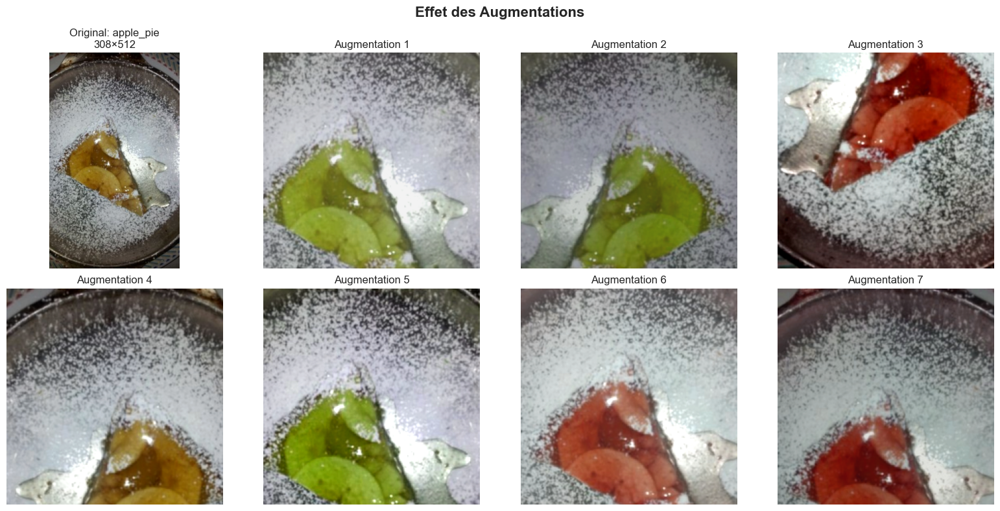

In [7]:
# Tester les transformations
from src.data.transforms import get_transforms, tensor_to_image

train_transform, test_transform = get_transforms(augmentation_level='medium')

# Prendre une image
img, label = train_dataset[0]
class_name = train_dataset.get_class_name(label)

# Appliquer plusieurs fois la transformation d'entraînement
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

# Original
axes[0].imshow(img)
axes[0].set_title(f"Original: {class_name}\n{img.size[0]}×{img.size[1]}")
axes[0].axis('off')

# Augmentations
for i in range(1, 8):
    aug_img = train_transform(img)
    aug_img_vis = tensor_to_image(aug_img).permute(1, 2, 0).numpy()
    
    axes[i].imshow(aug_img_vis)
    axes[i].set_title(f"Augmentation {i}")
    axes[i].axis('off')

plt.suptitle("Effet des Augmentations", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## 7. Conclusion

**Observations:**
- Dataset bien équilibré: 750 images/classe (train), 250 images/classe (test)
- Tailles d'images variables: nécessite redimensionnement
- Aspect ratios variés: data augmentation importante
- Forte variabilité intra-classe: challenge pour le modèle

**Prochaines étapes:**
1. Entraîner ResNet-50 avec transfer learning
2. Utiliser data augmentation pour améliorer la généralisation
3. Évaluer sur test set